# Phishing attacks Analysis Using Machine Learning

**Python libraries used:**
* Scikit-learn (http://scikit-learn.org): machine learning tools in Python.

**Data sources:**
* Kaggel: www.kaggle.com 
* Phishing webpage source: Phish Tank,
* OpenPhish Legitimate webpage source: Alexa, Common Crawl

**Problem Statement**

1) The Problem we are trying to solve is **Phishing attacks**

2) Phishing attacks are the top cybercrimes in the world. Cyber-attacks have been rated the fifth top rated risk in 2020 and     become the new norm across public and private sectors.
   According to a PhishMe survey, 91% of effective cyber-attacks start when someone enters personal information or clicks on a link out of curiosity, panic, or a sense of urgency.
   Every day, over 15 billion spam emails are sent out, which means that spam filters are "working overtime" and may allow harmful phishing assault emails to bypass them. 83% of businesses said they were victims of phishing attacks in 2021.Six billion more attacks are anticipated to occur in 2022.

3) To solve the problem we have used 3 methods and tried to identify the Phising websites based on the results generated by the algorithms.
 The three methods:
    1)	Logistic Regression
    2)	Decision Tree Classifier
    3)	Random Forest Classifier
    
4) By collecting the required features we can alert the user whether the website is genuine or a phishing one.


# Data Collection: 

In [45]:

# For dealing with data set
import numpy as np
import pandas as pd
import collections

# For plotting
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)
plt.rcParams['figure.figsize'] = (12,6)

import itertools

from imblearn import under_sampling, over_sampling

from sklearn.preprocessing import StandardScaler

# For predictions
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, recall_score, f1_score



In [46]:
df = pd.read_csv('Phishing_Legitimate_full.csv')

df.head(5)

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,44,0,0,0,0,0.000,0.250000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,0,2,1,0,41,1,0,0,0,0,0,17,16,103,0,1,0,0.000,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,27,24,0,0,0,0,0.375,1.000000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,22,50,0,0,0,1,1.000,0.095238,1,1,0,0,0,0.0,1,0,0,0,1,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,10,29,0,0,0,0,1.000,1.000000,0,0,0,1,0,0.0,1,0,0,0,0,1,0,0,1,1,-1,0,-1,-1,1


# Data Exploration: Exploring the Dataset



In [47]:
# Your code starts here
#   Please add comments or text cells in between to explain the general idea of each block of the code.
#   Please feel free to add more cells below this cell if necessary



float_cols = df.select_dtypes('float64').columns
for c in float_cols:
    df[c] = df[c].astype('float32')
    
int_cols = df.select_dtypes('int64').columns
for c in int_cols:
    df[c] = df[c].astype('int32')
    
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9980 entries, 0 to 9979
Data columns (total 50 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   id                                  9980 non-null   int32  
 1   NumDots                             9980 non-null   int32  
 2   SubdomainLevel                      9980 non-null   int32  
 3   PathLevel                           9980 non-null   int32  
 4   UrlLength                           9980 non-null   int32  
 5   NumDash                             9980 non-null   int32  
 6   NumDashInHostname                   9980 non-null   int32  
 7   AtSymbol                            9980 non-null   int32  
 8   TildeSymbol                         9980 non-null   int32  
 9   NumUnderscore                       9980 non-null   int32  
 10  NumPercent                          9980 non-null   int32  
 11  NumQueryComponents                  9980 no

In [48]:
df.rename(columns={'CLASS_LABEL': 'labels'}, inplace=True)
df.head()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,labels
0,1,3,1,5,72,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,44,0,0,0,0,0.000,0.250000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,0,2,1,0,41,1,0,0,0,0,0,17,16,103,0,1,0,0.000,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,27,24,0,0,0,0,0.375,1.000000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,22,50,0,0,0,1,1.000,0.095238,1,1,0,0,0,0.0,1,0,0,0,1,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,10,29,0,0,0,0,1.000,1.000000,0,0,0,1,0,0.0,1,0,0,0,0,1,0,0,1,1,-1,0,-1,-1,1


In [49]:
# Check for data duplications

duplicate_df = df[df.duplicated(keep = 'last')]
 
print("Duplicate Rows in the data are:")
duplicate_df

Duplicate Rows in the data are:


,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,labels


We dont have any duplicate rows

In [50]:
df.describe()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,labels
count,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.0,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000,9980.000000
mean,4990.500000,2.445090,0.585972,3.302806,70.312826,1.820341,0.139178,0.000301,0.013126,0.323647,0.073948,0.458918,0.277555,0.002305,5.816533,0.988778,0.525551,0.017234,0.022244,0.429058,0.0,18.827856,35.597796,8.618637,0.000902,0.109519,0.057214,0.241626,0.393015,0.167335,0.844088,0.248697,0.101804,0.057615,0.136292,0.215731,0.005511,0.014028,0.004910,0.128758,0.339379,0.032265,0.030361,0.956513,0.018537,0.353006,0.793186,0.173747,0.313026,0.501002
std,2881.122177,1.348001,0.751738,1.863487,33.383182,3.108566,0.546255,0.017336,0.113821,1.115561,0.622862,1.345815,1.118367,0.047953,9.625574,0.105345,0.499372,0.130150,0.147485,0.494966,0.0,8.123473,24.598073,24.334679,0.030018,0.369074,0.232264,0.342640,0.387516,0.373293,0.362790,0.432280,0.302405,0.233026,0.312668,0.411349,0.074035,0.117612,0.069901,0.334948,0.473522,0.176711,0.171586,0.248278,0.819859,0.889155,0.521041,0.756090,0.898279,0.500024
min,1.000000,1.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,2495.750000,2.000000,0.000000,2.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,14.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.029851,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-1.000000,-1.000000,1.000000,0.000000,-1.000000,0.000000
50%,4990.500000,2.000000,1.000000,3.000000,62.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,18.000000,30.000000,0.000000,0.000000,0.000000,0.000000,0.071429,0.246028,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000
75%,7485.250000,3.000000,1.000000,4.000000,84.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.0,22.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.317349,0.785714,0.000000,1.000000,0.000000,0.000000,0.000000,0.047619,0.000000,0.000000,0.000000,0.00000

In [51]:
# Check for  fraud transations count

n_no = len(df[df.labels == False])
n_yes = len(df[df.labels == True])
yes_percentage = (n_yes / (n_yes + n_no)) * 100

print("Number of Phishing: ", n_yes)
print("Number of Genuine : ", n_no)
print("Percentage of Phishing: {:.4f}".format(yes_percentage))

Number of Phishing:  5000
Number of Genuine :  4980
Percentage of Phishing: 50.1002


In [104]:
# Visualization of the count of fraud and genuine transations
# False stands for genuine transations and true is for fraud

df2 = df.groupby(["labels"]).count().reset_index()

fig = px.bar(df2,
             y=df.groupby(["labels"]).size(),labels={'true': "Hello", 'false': "Hi"},
             x="labels",
             color="labels",)

fig.update_layout(
    title="Bar graph representing how the data is balenced",
    xaxis_title="Labels",
    yaxis_title="Transactions",
    legend_title="Classified as Phishing",
    font=dict(
        family="Arial",
        size=12,
        color="Black"),
    
)
fig.show()

In [53]:
# Fetching the target feature

Y = df["labels"]

# Fetching the independent features

X = df.drop(["id", "labels"], axis= 1)


In [54]:
# Normalizing data

scaler = StandardScaler()
#X = scaler.fit_transform(X.values.reshape(-1, 1))
X = scaler.fit_transform(X)
X = pd.DataFrame(X)


# Data Analysis: you can use different methods to solve the problem you proposed, and find out the best solution.

In [56]:
# Your code starts here
#   Please add comments or text cells in between to explain the general idea of each block of the code.
#   Please feel free to add more cells below this cell if necessary

# Split the data to create test and training set

(X_train, X_test, Y_train, Y_test) = train_test_split(X, Y, test_size= 0.25, random_state= 42)

print("Shape of the training set: ", X_train.shape)
print("Shape of the testing set: ", X_test.shape)





Shape of the training set:  (7485, 48)
Shape of the testing set:  (2495, 48)


In [57]:
# Decision Tree Classifier

%%time
dt = DecisionTreeClassifier()
dt.fit(X_train, Y_train)

predictions = dt.predict(X_test)
score = dt.score(X_test, Y_test) * 100

print("Decision Tree Score: ", score)

Decision Tree Score:  97.0741482965932
CPU times: total: 62.5 ms
Wall time: 63.7 ms


In [111]:
matrix = confusion_matrix(Y_test, predictions.round())
print("Confusion Matrix for Decision Tree")
print(matrix)

Confusion Matrix for Decision Tree
[[1193   44]
 [  29 1229]]


In [58]:
# Logistic Regression

%%time
clf = LogisticRegression()
clf.fit(X_train, Y_train)

predictions_lr = clf.predict(X_test)
score_lr = clf.score(X_test, Y_test) * 100

print("Logistic Regression Score: ", score_lr)

Logistic Regression Score:  94.14829659318637
CPU times: total: 125 ms
Wall time: 75.9 ms


In [112]:
matrix_lr = confusion_matrix(Y_test, predictions_lr.round())
print("Confusion Matrix for Logistic Regression")
print(matrix_lr)

Confusion Matrix for Logistic Regression
[[1158   79]
 [  67 1191]]


In [59]:
# Random Forest Classifier

%%time
clf2 = RandomForestClassifier()
clf2.fit(X_train, Y_train)

predictions_fr = clf2.predict(X_test)
score_fr = clf2.score(X_test, Y_test) * 100

print("Random Forest Classifier Score: ", score_fr)

Random Forest Classifier Score:  98.11623246492987
CPU times: total: 672 ms
Wall time: 656 ms


In [113]:
matrix_fr = confusion_matrix(Y_test, predictions_fr.round())
print("Confusion Matrix for Random Forest Classifier")
print(matrix_fr)

Confusion Matrix for Random Forest Classifier
[[1208   29]
 [  18 1240]]


We have seperated 20 rows of data from the main data set. The models were not trained or tested with the data in predict.csv


In [81]:
dfr = pd.read_csv('predict.csv') #The models were not trained or tested with the data in predict.csv (Unknown Data)

dfr.head(5)

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,9981,2,1,0,29,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,1,0,0,0,0,0.133333,0.071429,0,0,0,0,0,0.333333,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0
1,9982,2,1,2,42,0,0,0,0,0,0,0,0,0,5,1,1,0,0,0,0,22,13,0,0,0,0,0.058824,0.333333,0,1,0,1,0,0.264706,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0
2,9983,3,1,4,47,0,0,0,0,0,0,0,0,0,8,1,1,0,0,1,0,19,21,0,0,0,0,0.149660,0.963964,1,1,1,0,1,0.006803,0,0,0,0,0,1,0,0,1,1,-1,-1,-1,1,0
3,9984,2,1,3,46,0,0,0,0,2,0,0,0,0,0,1,0,0,0,1,0,15,24,0,0,0,0,0.106383,0.625000,0,1,1,0,0,0.170213,0,0,0,0,0,1,0,0,1,1,1,1,-1,1,0
4,9985,2,1,2,48,1,0,0,0,0,0,0,0,0,6,1,1,0,0,0,0,16,25,0,0,0,0,0.099174,0.633333,0,0,0,0,0,0.033058,0,0,0,0,0,0,0,0,1,1,-1,1,0,1,0


In [82]:
dfr.rename(columns={'CLASS_LABEL': 'labels'}, inplace=True)

In [83]:
dfr.labels = dfr.labels.replace({1: True, 0: False})
dfr.head(5)

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,labels
0,9981,2,1,0,29,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,1,0,0,0,0,0.133333,0.071429,0,0,0,0,0,0.333333,0,0,0,0,0,0,0,0,1,1,1,1,1,0,False
1,9982,2,1,2,42,0,0,0,0,0,0,0,0,0,5,1,1,0,0,0,0,22,13,0,0,0,0,0.058824,0.333333,0,1,0,1,0,0.264706,0,0,0,0,1,1,0,0,1,1,0,0,0,0,False
2,9983,3,1,4,47,0,0,0,0,0,0,0,0,0,8,1,1,0,0,1,0,19,21,0,0,0,0,0.149660,0.963964,1,1,1,0,1,0.006803,0,0,0,0,0,1,0,0,1,1,-1,-1,-1,1,False
3,9984,2,1,3,46,0,0,0,0,2,0,0,0,0,0,1,0,0,0,1,0,15,24,0,0,0,0,0.106383,0.625000,0,1,1,0,0,0.170213,0,0,0,0,0,1,0,0,1,1,1,1,-1,1,False
4,9985,2,1,2,48,1,0,0,0,0,0,0,0,0,6,1,1,0,0,0,0,16,25,0,0,0,0,0.099174,0.633333,0,0,0,0,0,0.033058,0,0,0,0,0,0,0,0,1,1,-1,1,0,1,False


In [84]:
Yr = dfr["labels"]

# Fetching the independent features

Xr = dfr.drop(["id", "labels"], axis= 1)

In [85]:
scaler = StandardScaler()
#X = scaler.fit_transform(X.values.reshape(-1, 1))
Xr = scaler.fit_transform(Xr)
Xr = pd.DataFrame(Xr)

# Results: summarize and visualize the results discovered from the analysis

Please use figures, tables, or videos to communicate the results with the audience.


In [114]:
# Your code starts here
#   Please add comments or text cells in between to explain the general idea of each block of the code.
#   Please feel free to add more cells below this cell if necessary
# Import tools needed for visualization

# To plot the confusion matrix

def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

Confusion matrix, without normalization


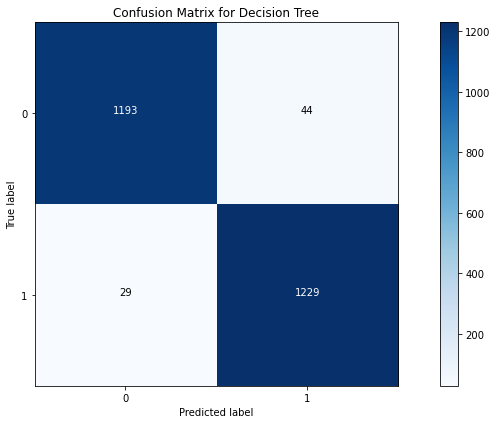

In [115]:
plot_confusion_matrix(matrix, classes=[0, 1], title= "Confusion Matrix for Decision Tree")

Confusion matrix, without normalization


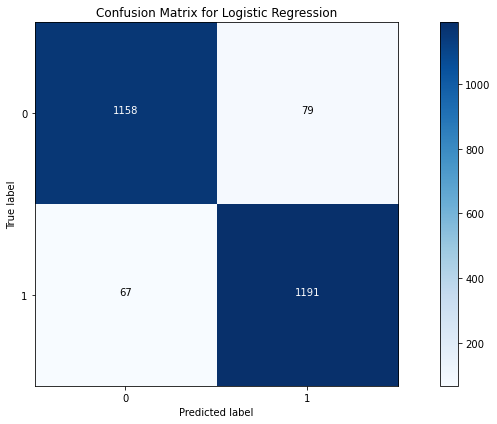

In [116]:
plot_confusion_matrix(matrix_lr, classes=[0, 1], title= "Confusion Matrix for Logistic Regression")

Confusion matrix, without normalization


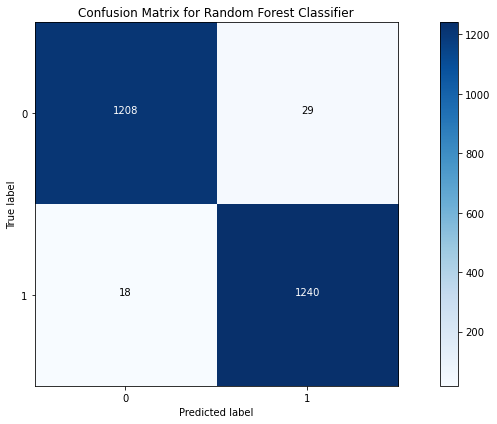

In [117]:
plot_confusion_matrix(matrix_fr, classes=[0, 1], title= "Confusion Matrix for Random Forest Classifier")

In [118]:
#Prediction for Unknown Data using Decision Tree Classifier


dfp_dt = pd.DataFrame() 
predictionsr_dt = dt.predict(Xr)
dfp_dt["Class_True"] = Yr
predictionsr_dt = pd.DataFrame(predictionsr_dt)
predictionsr_dt = predictionsr_dt.replace({1: True, 0: False})
dfp_dt["Class_Predicted"] = predictionsr_dt
print("The Predicted Values for Decision Tree Classifier is: ")
print(dfp_dt)

The Predicted Values for Decision Tree Classifier is: 
    Class_True  Class_Predicted
0        False             True
1        False            False
2        False            False
3        False            False
4        False            False
5        False            False
6        False            False
7        False             True
8        False            False
9        False            False
10       False             True
11       False            False
12       False            False
13       False            False
14       False            False
15       False            False
16       False            False
17       False            False
18       False            False
19       False             True


In [119]:
#Prediction for Unknown Data using Random Forest Classifier


dfp_fr = pd.DataFrame()

predictionsr_fr = clf2.predict(Xr)
dfp_fr["Class_True"] = Yr
predictionsr_fr = pd.DataFrame(predictionsr_fr)
predictionsr_fr = predictionsr_fr.replace({1: True, 0: False})
dfp_fr["Class_Predicted"] = predictionsr_fr
print("The Predicted Values for Random Forest Classifier is: ")
print(dfp_fr)

The Predicted Values for Random Forest Classifier is: 
    Class_True  Class_Predicted
0        False            False
1        False             True
2        False            False
3        False            False
4        False            False
5        False            False
6        False            False
7        False             True
8        False            False
9        False            False
10       False             True
11       False            False
12       False            False
13       False            False
14       False            False
15       False            False
16       False            False
17       False            False
18       False            False
19       False            False


In [120]:
#Prediction for Unknown Data using Logistic Regression


dfp_lr = pd.DataFrame()

predictionsr_lr = clf.predict(Xr)
dfp_lr["Class_True"] = Yr
predictionsr_lr = pd.DataFrame(predictionsr_lr)
predictionsr_lr = predictionsr_lr.replace({1: True, 0: False})
dfp_lr["Class_Predicted"] = predictionsr_lr
print("The Predicted Values for Logistic Regression is: ")
print(dfp_lr)

The Predicted Values for Logistic Regression is: 
    Class_True  Class_Predicted
0        False             True
1        False             True
2        False            False
3        False            False
4        False            False
5        False             True
6        False             True
7        False             True
8        False            False
9        False            False
10       False             True
11       False             True
12       False            False
13       False            False
14       False            False
15       False             True
16       False            False
17       False             True
18       False            False
19       False            False


Decision Tree for Decision Tree Classifier is:


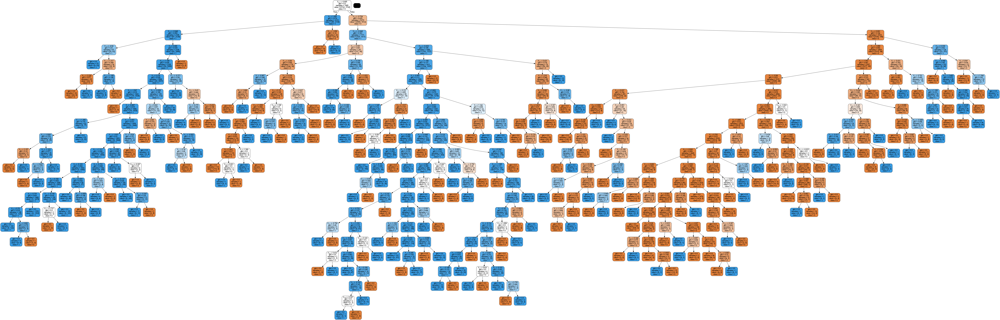

In [109]:
#Building Decsion Trees

from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus




dot_data = StringIO()
export_graphviz(dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
print("Decision Tree for Decision Tree Classifier is:")
graph.write_png('phishing.png')
Image(graph.create_png())







In [110]:
#Building Decsion Trees

from sklearn.tree import export_graphviz
estimator = clf2.estimators_[5]

# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                class_names = ['0','1'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
print("Decision Tree for Random Forest Classifier is:")
from IPython.display import Image
Image(filename = 'tree.png')

Decision Tree for Random Forest Classifier is:


**Conclusion:**
* Comparing all the results we have in the results section we can observe that the “Random Forest Classifier” is the best prediction model for our dataset. 
* We are able to achieve 98% accuracy and the confusion matrix for random forest classifier gives very good results. Even though the time for training and testing the data is more, but as the accuracy and all other results are showing that random forest classifier is a good choice for this.  
* The Random Forest Classifier trained model can be used to detect any phishing mails or websites.
